Chcielibyśmy określić najpopularniejsze miejsca startu i celu dla poszczególnych godzin. Dzięki temu będziemy mogli określić położenie tzw. 'residential areas' skąd ludzie wyruszają na rowerach do pracy oraz miejsca ich zatrudnienia.

Ten notatnik służy ostatecznie do stworzenia gifu: BicycleTraffic700.gif

In [1]:
import pandas as pd
import zipfile
import os
from datetime import datetime
import numpy as np

# Dane

In [2]:
data_folder = 'data'
data_file_sample = '201910-citibike-tripdata'
data_path = os.path.join(os.getcwd(), data_folder, data_file_sample+'.csv.zip')
zf = zipfile.ZipFile(data_path)
data_sample = pd.read_csv(zf.open(data_file_sample+'.csv'), parse_dates=['starttime', 'stoptime'])

In [3]:
data_sample.head()

,tripduration,starttime,stoptime,start station id,start station name,start station latitude,start station longitude,end station id,end station name,end station latitude,end station longitude,bikeid,usertype,birth year,gender
0,527,2019-10-01 00:00:05.618,2019-10-01 00:08:52.943,3746,6 Ave & Broome St,40.724308,-74.004730,223,W 13 St & 7 Ave,40.737815,-73.999947,41750,Subscriber,1993,1
1,174,2019-10-01 00:00:15.875,2019-10-01 00:03:10.168,3301,Columbus Ave & W 95 St,40.791956,-73.968087,3283,W 89 St & Columbus Ave,40.788221,-73.970416,18264,Subscriber,1992,1
2,759,2019-10-01 00:00:19.824,2019-10-01 00:12:59.707,161,LaGuardia Pl & W 3 St,40.729170,-73.998102,174,E 25 St & 1 Ave,40.738177,-73.977387,25525,Subscriber,1995,1
3,615,2019-10-01 00:00:21.068,2019-10-01 00:10:36.679,254,W 11 St & 6 Ave,40.735324,-73.998004,477,W 41 St & 8 Ave,40.756405,-73.990026,30186,Subscriber,1992,1
4,761,2019-10-01 00:00:26.380,2019-10-01 00:13:08.313,161,LaGuardia Pl & W 3 St,40.729170,-73.998102,174,E 25 St & 1 Ave,40.738177,-73.977387,25597,Subscriber,1992,1


In [4]:
data_sample.shape

(2092573, 15)

In [5]:
data_sample.columns

Index(['tripduration', 'starttime', 'stoptime', 'start station id',
       'start station name', 'start station latitude',
       'start station longitude', 'end station id', 'end station name',
       'end station latitude', 'end station longitude', 'bikeid', 'usertype',
       'birth year', 'gender'],
      dtype='object')

In [8]:
data_sample[["usertype"]].groupby("usertype").size()

usertype
Customer       295753
Subscriber    1796820
dtype: int64

In [7]:
data_sample["usertype"].isnull().any()

False

# grupowanie po stacjach i czasach

In [68]:
%matplotlib inline
import matplotlib.pyplot as plt

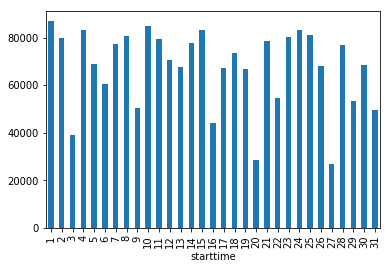

In [10]:
data_sample["starttime"].groupby(data_sample["starttime"].dt.day).count().plot(kind="bar")

In [91]:
StartData = data_sample[["starttime","start station id"]].copy()\
    .groupby([data_sample["starttime"].dt.hour,"start station id"])\
    .count()
StartData.columns = ["StartCount"]
StartData = StartData.reset_index()

In [92]:
EndData = data_sample[["stoptime","end station id"]].copy()\
    .groupby([data_sample["stoptime"].dt.hour,"end station id"])\
    .count()
EndData.columns = ["EndCount"]
EndData = EndData.reset_index()

In [93]:
StartStations = data_sample[["start station name","start station id","start station latitude","start station longitude"]].drop_duplicates()
EndStations = data_sample[["end station name","end station id","end station latitude","end station longitude"]].drop_duplicates()

In [94]:
StartData = StartData.merge(StartStations,how="left",on="start station id")
EndData = EndData.merge(EndStations,how="left",on="end station id")

In [78]:
StartData.head()

,starttime,start station id,StartCount,start station name,start station latitude,start station longitude
0,0,72,17,W 52 St & 11 Ave,40.767272,-73.993929
1,0,79,20,Franklin St & W Broadway,40.719116,-74.006667
2,0,82,2,St James Pl & Pearl St,40.711174,-74.000165
3,0,83,18,Atlantic Ave & Fort Greene Pl,40.683826,-73.976323
4,0,116,61,W 17 St & 8 Ave,40.741776,-74.001497


In [67]:
# pakiety do map
import descartes
import geopandas as gpd
from shapely.geometry import Point, Polygon

In [59]:
nybb = gpd.read_file(gpd.datasets.get_path('nybb')).to_crs(epsg=4326)

/home/baneckik/.local/lib/python3.7/site-packages/pyproj/crs.py:77: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.
  return _prepare_from_string(" ".join(pjargs))


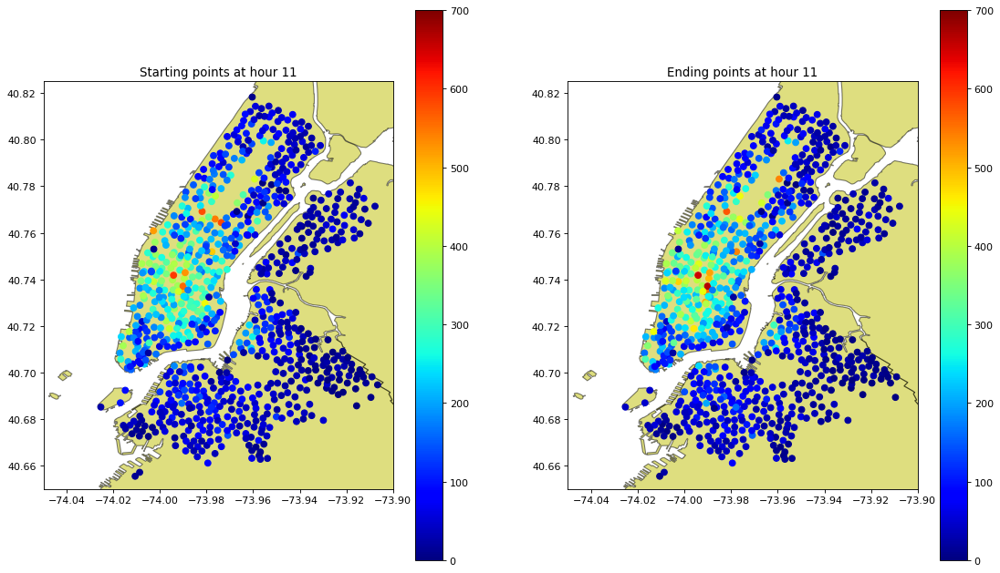

In [95]:
i = 11
Max_freq=700
data = StartData.query("starttime=="+str(i))

#fig = plt.figure(figsize=(17, 10), dpi= 80, facecolor='w', edgecolor='k')
fig, ax = plt.subplots(1, 2,figsize=(17, 10), dpi= 80, facecolor='w', edgecolor='none')

nybb.plot(ax=ax[0], figsize=(10, 10), alpha=0.5, edgecolor='k',color='y')
ax[0].set_ylim(40.65,40.825)
ax[0].set_xlim(-74.05,-73.9)
ax[0].title.set_text('Starting points at hour '+str(i))

sc = ax[0].scatter(x=data["start station longitude"],y=data['start station latitude'],\
                                     c=data['StartCount'], cmap=plt.get_cmap('jet'),\
                                     vmin=0,vmax=Max_freq)
plt.colorbar(sc, ax=ax[0])

data = EndData.query("stoptime=="+str(i))

nybb.plot(ax=ax[1], figsize=(10, 10), alpha=0.5, edgecolor='k',color='y')
ax[1].set_ylim(40.65,40.825)
ax[1].set_xlim(-74.05,-73.9)
ax[1].title.set_text('Ending points at hour '+str(i))

sc = ax[1].scatter(x=data["end station longitude"],y=data['end station latitude'],\
                                     c=data['EndCount'], cmap=plt.get_cmap('jet'),\
                                     vmin=0,vmax=Max_freq)
plt.colorbar(sc, ax=ax[1])

plt.show()

# Tworzenie gifa

In [185]:
import imageio

def plot_for_hour(hour,Max_freq):
    # Data for plotting
    i = hour
    data = StartData.query("starttime=="+str(i))
    fig, ax = plt.subplots(1, 2,figsize=(17, 10), dpi= 80, facecolor='w', edgecolor='none')
    
    nybb.plot(ax=ax[0], figsize=(10, 10), alpha=0.5, edgecolor='k',color='y')
    ax[0].set_ylim(40.65,40.825)
    ax[0].set_xlim(-74.05,-73.9)
    ax[0].title.set_text('Starting points at hour '+str(i))

    sc = ax[0].scatter(x=data["start station longitude"],y=data['start station latitude'],\
                                         c=data['StartCount'], cmap=plt.get_cmap('jet'),\
                                         vmin=0,vmax=Max_freq)
    plt.colorbar(sc, ax=ax[0])

    data = EndData.query("stoptime=="+str(i))
    nybb.plot(ax=ax[1], figsize=(10, 10), alpha=0.5, edgecolor='k',color='y')
    ax[1].set_ylim(40.65,40.825)
    ax[1].set_xlim(-74.05,-73.9)
    ax[1].title.set_text('Ending points at hour '+str(i))

    sc = ax[1].scatter(x=data["end station longitude"],y=data['end station latitude'],\
                                         c=data['EndCount'], cmap=plt.get_cmap('jet'),\
                                         vmin=0,vmax=Max_freq)
    plt.colorbar(sc, ax=ax[1])

    # Used to return the plot as an image rray
    fig.canvas.draw()       # draw the canvas, cache the renderer
    image = np.frombuffer(fig.canvas.tostring_rgb(), dtype='uint8')
    image  = image.reshape(fig.canvas.get_width_height()[::-1] + (3,))

    return image

/opt/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
/opt/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
/opt/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume t

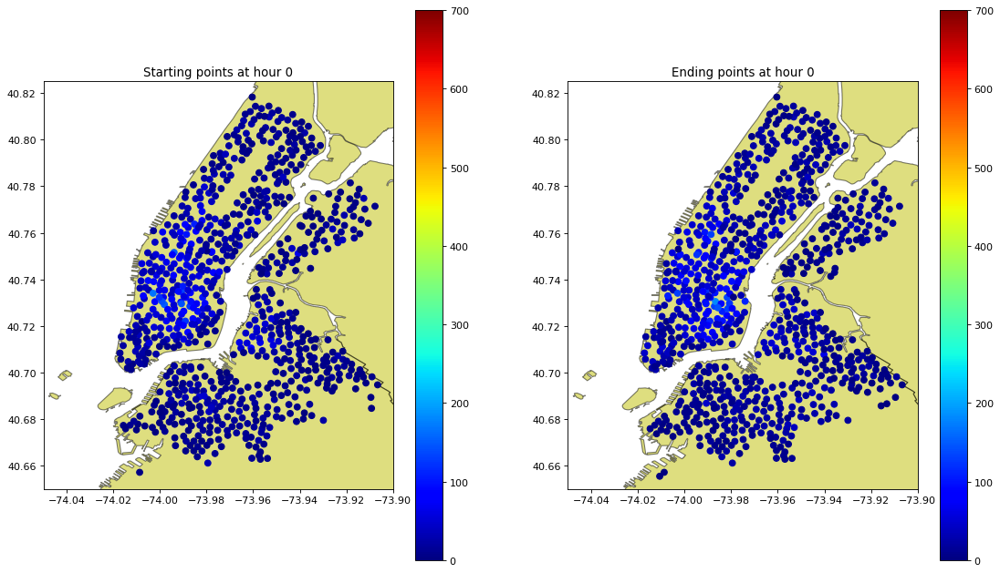

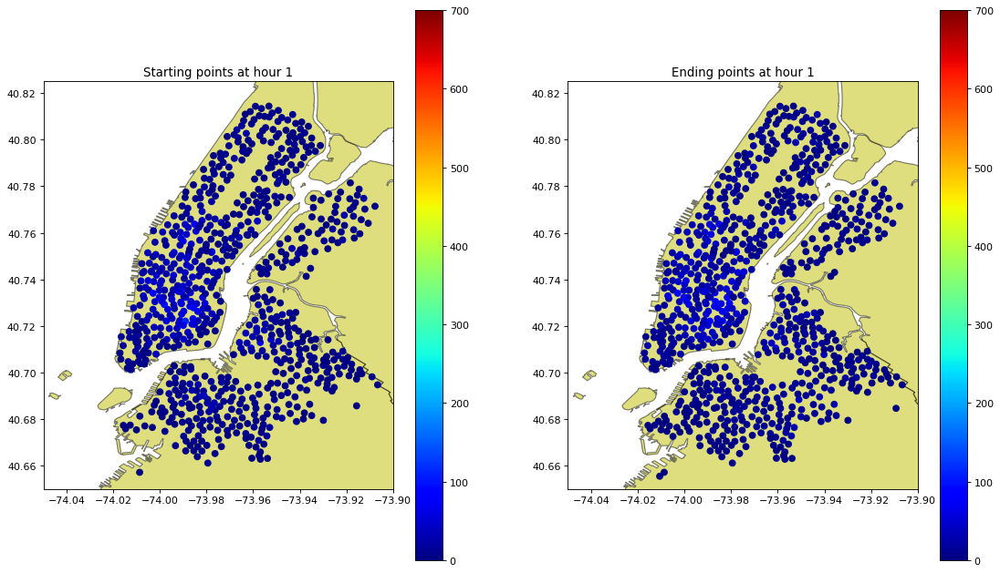

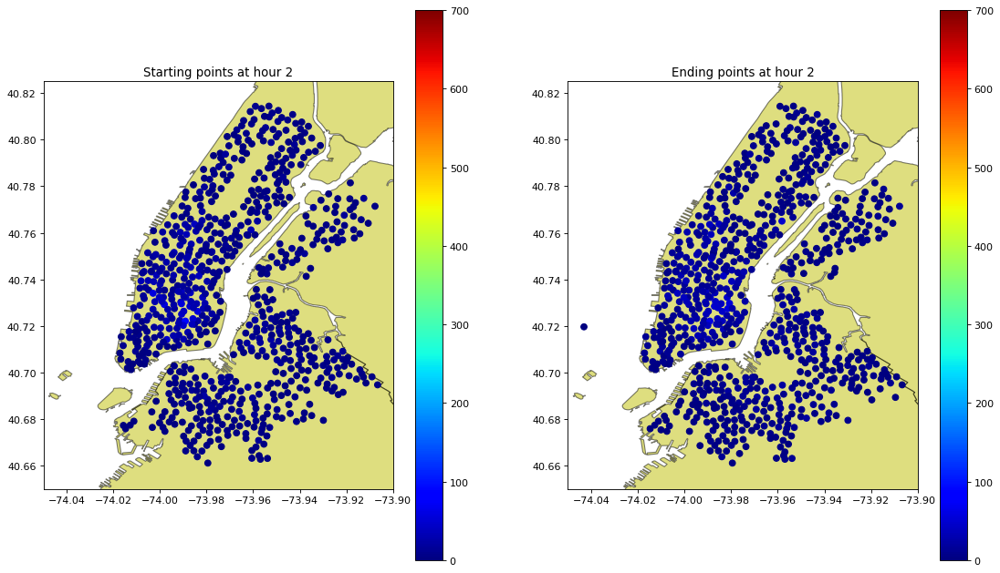

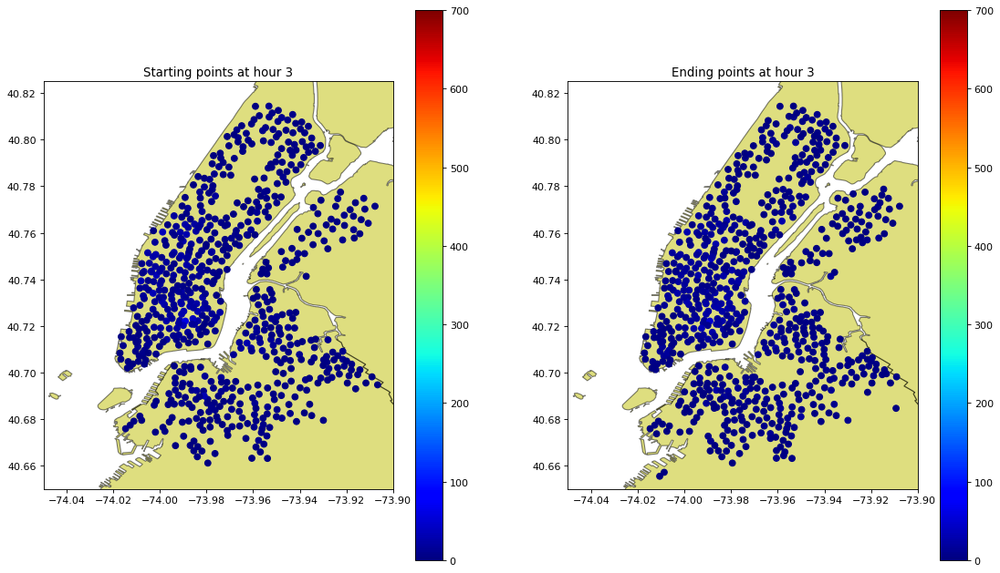

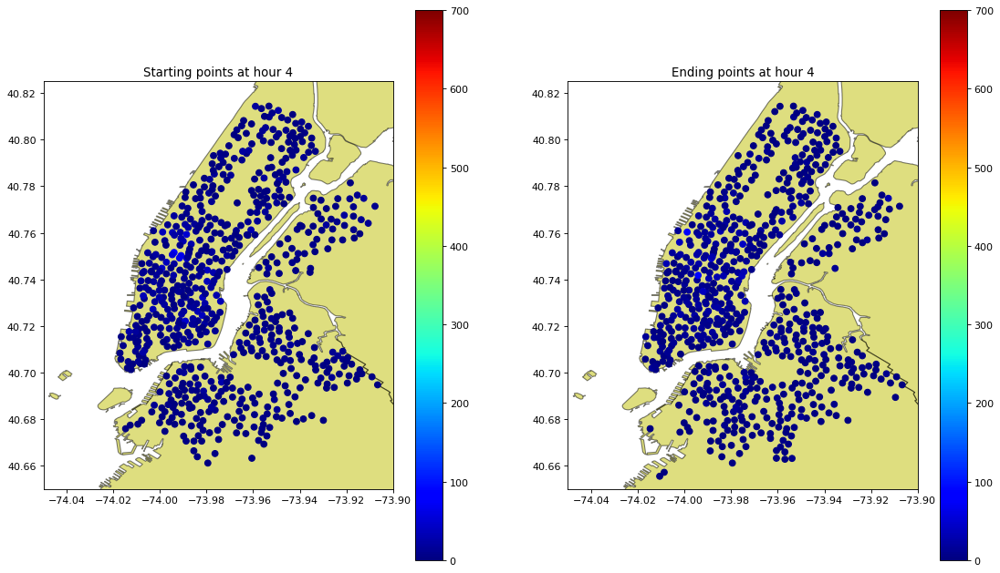

...

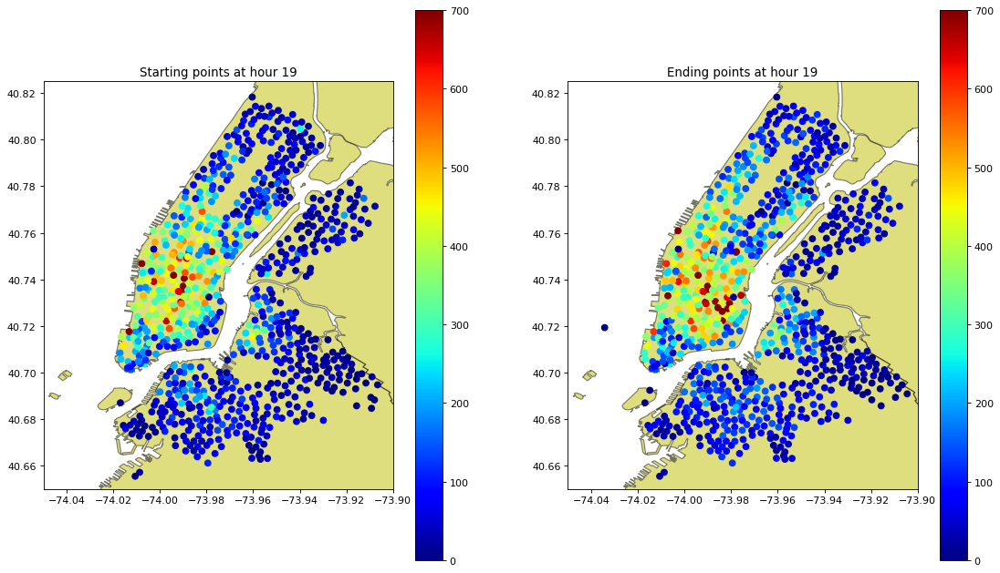

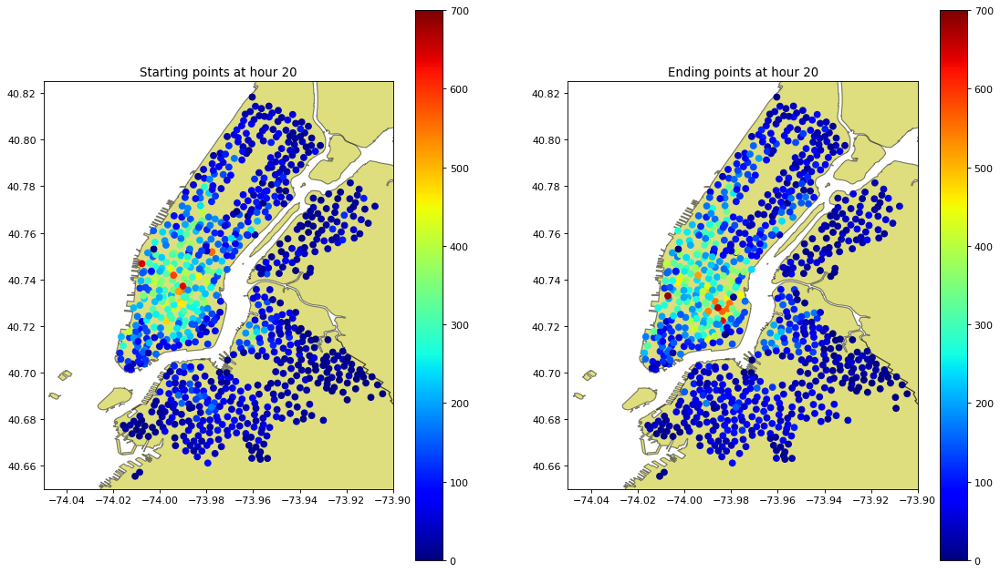

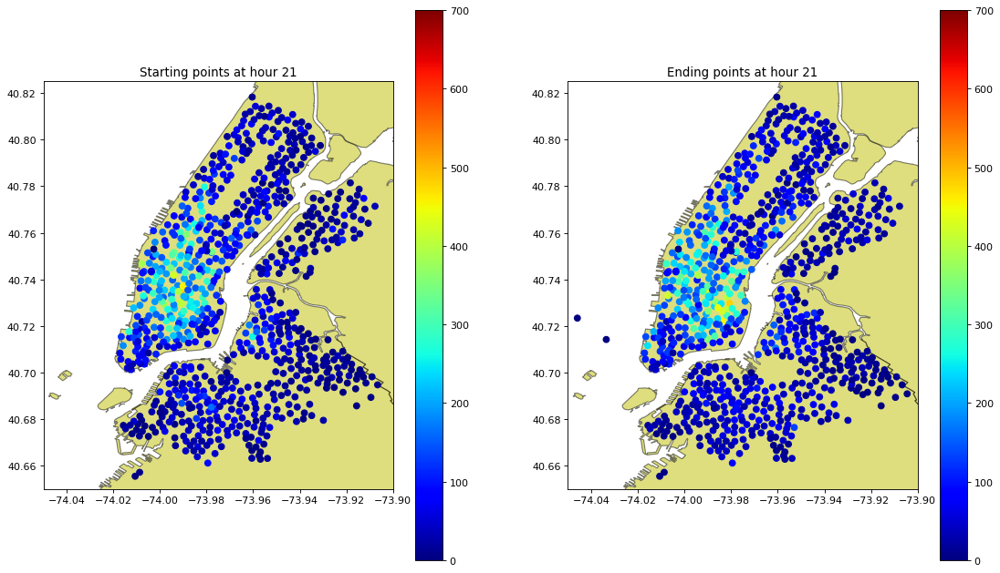

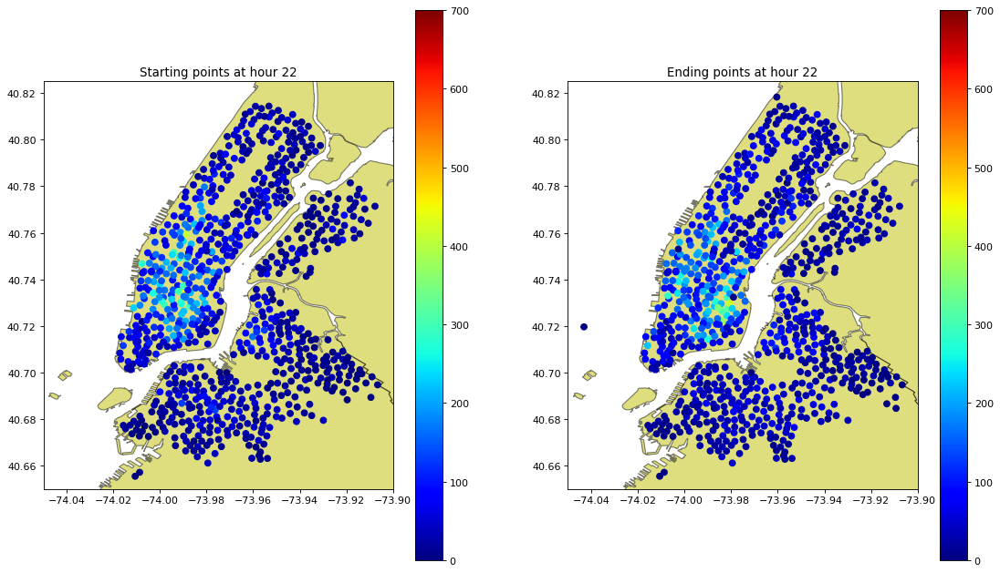

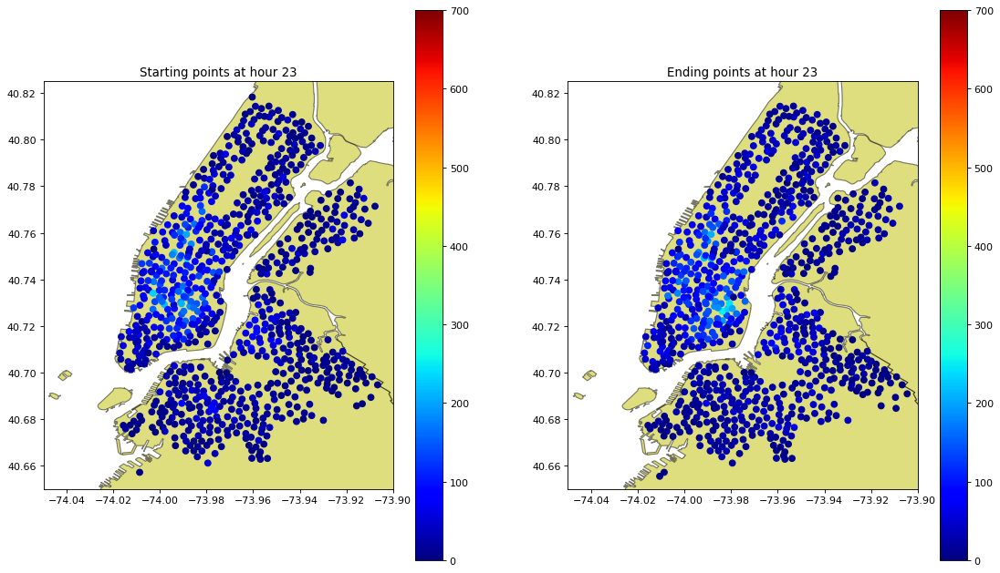

In [186]:
kwargs_write = {'fps':1.0, 'quantizer':'nq'}
Max_freq=700
imageio.mimsave('./BicycleTraffic'+str(Max_freq)+'.gif', [plot_for_hour(i,Max_freq) for i in range(24)], fps=1)

# Określenie obszarów mieszkalnych i miejsc pracy

## Stworzenie tabeli ze stacjami i liczbą przyjazdów i odjazdów dla każdej godziny

In [19]:
print(StartData.shape)
print(EndData.shape)

(19213, 6)
(19306, 6)


In [96]:
StartData.columns = ["time","id","StartCount","name","latitude","longitude"]
EndData.columns = ["time","id","EndCount","name","latitude","longitude"]

In [97]:
Stations = StartData.merge(EndData,how="outer", on=["time","id","name","latitude","longitude"])

In [98]:
Stations.tail()

,time,id,StartCount,name,latitude,longitude,EndCount
19694,23,3816,NaN,Metropolitan Ave & Vandervoort Ave,40.71429,-73.93323,3.0
19695,23,3826,NaN,Moffat St & Bushwick,40.68458,-73.90925,2.0
19696,23,3833,NaN,Madison St & Evergreen Ave,40.69122,-73.91693,1.0
19697,23,3836,NaN,Bushwick Ave & Linden St,40.69146,-73.92146,5.0
19698,23,3865,NaN,Knickerbocker Ave & Cooper St,40.69081,-73.90448,1.0


In [99]:
Stations.StartCount = Stations.StartCount.fillna(0)
Stations.EndCount = Stations.EndCount.fillna(0)

In [100]:
Stations.shape

(19699, 7)

## Określenie stacji które są odjazdowe rano, albo przyjazdowe wieczorem

Rano traktujemy jako godz 8-9, wieczór jako 17-18.

In [110]:
MorningStations = Stations.query("time>=8 & time<=9").groupby(["id","name","latitude","longitude"]).sum().reset_index()
MorningStations["diff"] = MorningStations["EndCount"]-MorningStations["StartCount"]
MorningStations = MorningStations.sort_values("diff", ascending=False)
MorningStations.head()

,id,name,latitude,longitude,time,StartCount,EndCount,diff
154,402,Broadway & E 22 St,40.740343,-73.989551,17,1113.0,4410.0,3297.0
122,359,E 47 St & Park Ave,40.755103,-73.974987,17,1241.0,3993.0,2752.0
63,281,Grand Army Plaza & Central Park S,40.764397,-73.973715,17,430.0,2782.0,2352.0
134,377,6 Ave & Canal St,40.722438,-74.005664,17,298.0,2573.0,2275.0
171,426,West St & Chambers St,40.717548,-74.013221,17,1179.0,3431.0,2252.0


In [111]:
EveningStations = Stations.query("time>=17 & time<=18").groupby(["id","name","latitude","longitude"]).sum().reset_index()
EveningStations["diff"] = EveningStations["EndCount"]-EveningStations["StartCount"]
EveningStations = EveningStations.sort_values("diff", ascending=False)
EveningStations.head()

,id,name,latitude,longitude,time,StartCount,EndCount,diff
404,3255,8 Ave & W 31 St,40.750585,-73.994685,35,1570.0,4016.0,2446.0
239,514,12 Ave & W 40 St,40.760875,-74.002777,35,1581.0,3421.0,1840.0
183,445,E 10 St & Avenue A,40.727408,-73.981420,35,745.0,2032.0,1287.0
231,501,FDR Drive & E 35 St,40.744219,-73.971212,35,998.0,1947.0,949.0
89,317,E 6 St & Avenue B,40.724537,-73.981854,35,784.0,1708.0,924.0


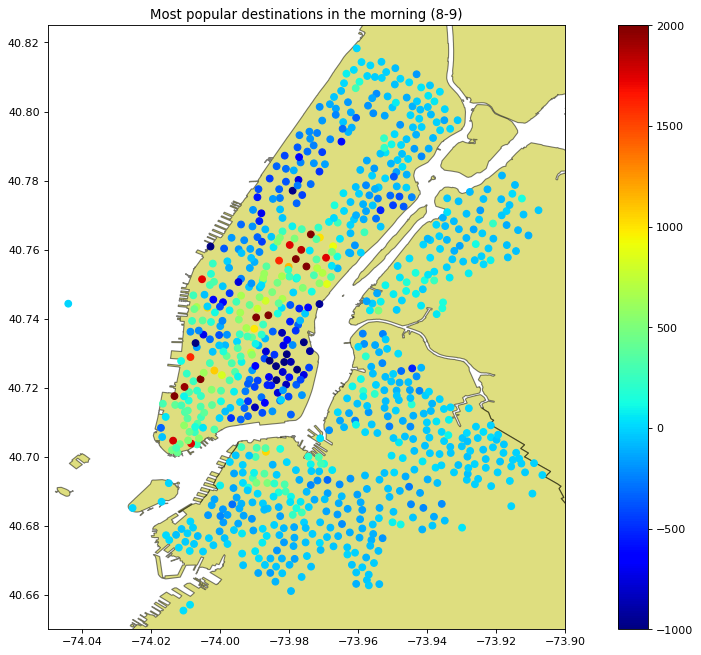

In [106]:
fig, ax = plt.subplots(figsize=(17, 10), dpi= 80, facecolor='w', edgecolor='none')
nybb.plot(ax=ax, figsize=(10, 10), alpha=0.5, edgecolor='k',color='y')
ax.set_ylim(40.65,40.825)
ax.set_xlim(-74.05,-73.9)
ax.title.set_text('Most popular destinations in the morning (8-9)')

sc = ax.scatter(x=MorningStations["longitude"],y=MorningStations["latitude"],\
                                     c=MorningStations["diff"], cmap=plt.get_cmap('jet'),\
               vmin=-1000,vmax=2000)

plt.colorbar(sc, ax=ax)

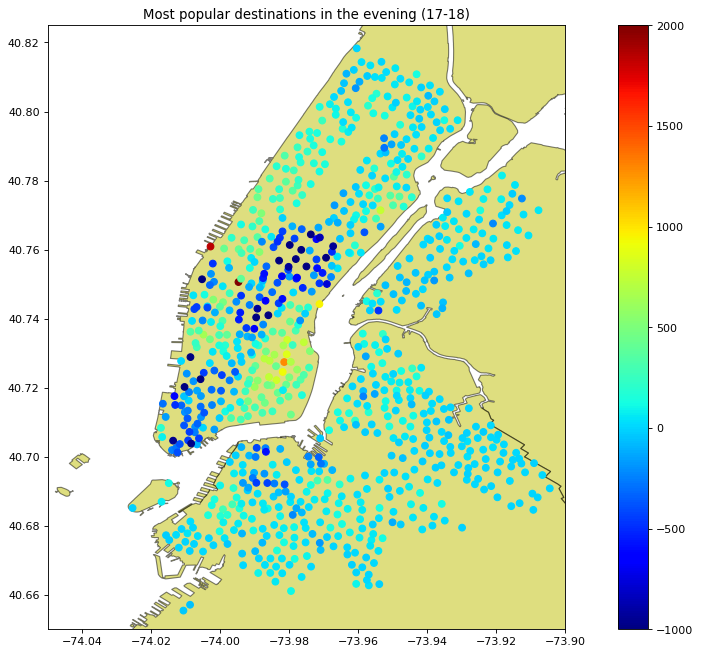

In [113]:
fig, ax = plt.subplots(figsize=(17, 10), dpi= 80, facecolor='w', edgecolor='none')
nybb.plot(ax=ax, figsize=(10, 10), alpha=0.5, edgecolor='k',color='y')
ax.set_ylim(40.65,40.825)
ax.set_xlim(-74.05,-73.9)
ax.title.set_text('Most popular destinations in the evening (17-18)')

sc = ax.scatter(x=EveningStations["longitude"],y=EveningStations["latitude"],\
                                     c=EveningStations["diff"], cmap=plt.get_cmap('jet'),\
               vmin=-1000,vmax=2000)

plt.colorbar(sc, ax=ax)

Czerwona kropka na lewo-góra, tuż przy brzegu to ,,12 Ave & W 40 St''. Znajduje się tuż przy tunelu Lincolna prowadzącym do Jersey city. Prawdopodobnie ludzie się tam przesiadają.

# Śmietnik

/home/baneckik/.local/lib/python3.7/site-packages/pyproj/crs.py:77: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.
  return _prepare_from_string(" ".join(pjargs))


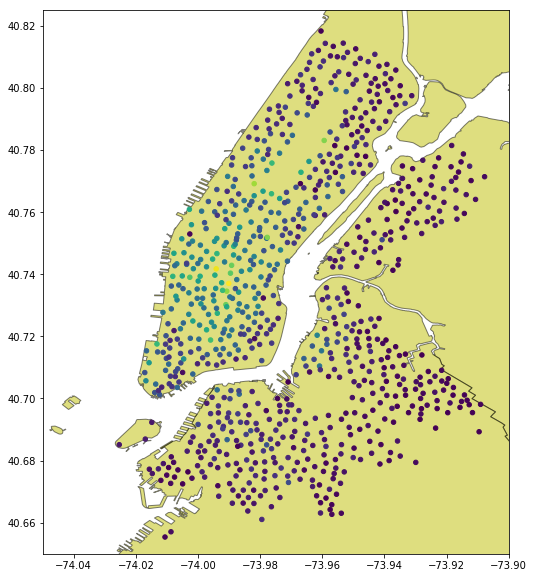

In [146]:
nybb = gpd.read_file(gpd.datasets.get_path('nybb')).to_crs(epsg=4326)
ax.set_ylim(40.65,40.825)
ax.set_xlim(-74.05,-73.9)
points = data[["end station latitude","end station longitude"]].copy()
geom = [Point(xy) for xy in zip(points["end station longitude"],points["end station latitude"])]
geo_df = gpd.GeoDataFrame(points,geometry=geom)
geo_df.plot(ax=ax,markersize=20,c=data["EndCount"])
plt.show()